# IMDB movie reviews sentimental analysis

In [1]:
# Importing necessary libraries

In [2]:
from selenium import webdriver
from bs4 import BeautifulSoup as bs
from selenium.common.exceptions import NoSuchElementException
from selenium.common.exceptions import ElementNotVisibleException
import time
import re

In [3]:
# Loading the webdriver for the chrome

In [18]:
browser = webdriver.Chrome(r"D:\chromedriver")

In [19]:
# Using the IMDB reviews of "Paatal Lok" web series

In [20]:
page = "https://www.imdb.com/title/tt9680440/reviews?ref_=tt_ql_3"

In [21]:
browser.get(page)

## Reviews extraction

In [23]:
reviews = []

In [24]:
i=1
while (i>0):
    
    try:
        button = browser.find_element_by_xpath('//*[@id="load-more-trigger"]')
        button.click()
        time.sleep(5)
        ps = browser.page_source
        soup= bs(ps, "html.parser")
        rev = soup.findAll("div", attrs={"class","text"})
        text = [e.get_text() for e in rev]
        reviews.extend(text)
    except NoSuchElementException:
        break
    except ElementNotVisibleException:
        break

ElementNotInteractableException: Message: element not interactable
  (Session info: chrome=86.0.4240.111)


In [25]:
len(reviews)

38459

In [26]:
# Checking the reviews obtained from IMDB

In [27]:
reviews

["I don't write reviews but the ratings break my heart. The show shows exactly what is wrong with the Indian society. The bad ratings and the backlash proves how ignorant and overtly sensitive we are to the truth.\nStellar performances, incredibly layered characters, amazing character building, brilliant writing & direction.\nThis tops Sacred Games for me as an overall show. Believe a stranger, give it a watch if you haven't. Watch it with an open mind. Set aside your ego and privileges before you do, though.",
 "This is much realistic and advanced thriller, wayyyy better than Sacred Games. This is actually what is happening in the country! True picture.. lot of pro government won't like the series and will give low reviews but just watch it being a neutral viewer and you will love it!\nI still wonder how in this era when every filmmaker is trying to please the government someone actually came up with this realistic approach! Hats off to the directors",
 'Saw the series in one sitting\

In [28]:
len(list(set(reviews)))

1355

#### Total 1355 reiews have been extracted

## Text processing

In [29]:
# Removing panctuations, numbers from the reviews and converting all the words to lower cases

In [30]:
cleaned_reviews= re.sub("[^A-Za-z0-9" "]+"," ",str(reviews))

In [31]:
cleaned_reviews

' I don t write reviews but the ratings break my heart The show shows exactly what is wrong with the Indian society The bad ratings and the backlash proves how ignorant and overtly sensitive we are to the truth nStellar performances incredibly layered characters amazing character building brilliant writing direction nThis tops Sacred Games for me as an overall show Believe a stranger give it a watch if you haven t Watch it with an open mind Set aside your ego and privileges before you do though This is much realistic and advanced thriller wayyyy better than Sacred Games This is actually what is happening in the country True picture lot of pro government won t like the series and will give low reviews but just watch it being a neutral viewer and you will love it nI still wonder how in this era when every filmmaker is trying to please the government someone actually came up with this realistic approach Hats off to the directors Saw the series in one sitting nWhat a amazing show and excel

In [32]:
# Saving the reviews in the form of text file

In [33]:
with open("imdb_paatalok.txt", "w", encoding="utf8") as output:
    output.write(str(reviews))

In [34]:
# Splitting each word in the review

In [35]:
imdb_rev_words = cleaned_reviews.split(" ")
imdb_rev_words

['',
 'I',
 'don',
 't',
 'write',
 'reviews',
 'but',
 'the',
 'ratings',
 'break',
 'my',
 'heart',
 'The',
 'show',
 'shows',
 'exactly',
 'what',
 'is',
 'wrong',
 'with',
 'the',
 'Indian',
 'society',
 'The',
 'bad',
 'ratings',
 'and',
 'the',
 'backlash',
 'proves',
 'how',
 'ignorant',
 'and',
 'overtly',
 'sensitive',
 'we',
 'are',
 'to',
 'the',
 'truth',
 'nStellar',
 'performances',
 'incredibly',
 'layered',
 'characters',
 'amazing',
 'character',
 'building',
 'brilliant',
 'writing',
 'direction',
 'nThis',
 'tops',
 'Sacred',
 'Games',
 'for',
 'me',
 'as',
 'an',
 'overall',
 'show',
 'Believe',
 'a',
 'stranger',
 'give',
 'it',
 'a',
 'watch',
 'if',
 'you',
 'haven',
 't',
 'Watch',
 'it',
 'with',
 'an',
 'open',
 'mind',
 'Set',
 'aside',
 'your',
 'ego',
 'and',
 'privileges',
 'before',
 'you',
 'do',
 'though',
 'This',
 'is',
 'much',
 'realistic',
 'and',
 'advanced',
 'thriller',
 'wayyyy',
 'better',
 'than',
 'Sacred',
 'Games',
 'This',
 'is',
 'actual

In [40]:
len(imdb_rev_words)

1968430

In [36]:
# Importing the stop words 

In [37]:
with open(r"D:\Data science\Python codes\Data sets\NLP words list\stopwords.txt","r") as sw:
    stopwords = sw.read()

In [38]:
stopwords = stopwords.split("\n")

In [39]:
# Removing all the stop words from reviews

In [41]:
imdb_rev_words = [w for w in imdb_rev_words if not w in stopwords]
imdb_rev_words

['I',
 'don',
 'write',
 'reviews',
 'ratings',
 'break',
 'heart',
 'The',
 'exactly',
 'wrong',
 'Indian',
 'society',
 'The',
 'bad',
 'ratings',
 'backlash',
 'proves',
 'ignorant',
 'overtly',
 'sensitive',
 'truth',
 'nStellar',
 'performances',
 'incredibly',
 'layered',
 'characters',
 'amazing',
 'character',
 'building',
 'brilliant',
 'writing',
 'direction',
 'nThis',
 'tops',
 'Sacred',
 'Games',
 'overall',
 'Believe',
 'stranger',
 'watch',
 'haven',
 'Watch',
 'mind',
 'Set',
 'aside',
 'ego',
 'privileges',
 'This',
 'realistic',
 'advanced',
 'thriller',
 'wayyyy',
 'Sacred',
 'Games',
 'This',
 'actually',
 'happening',
 'country',
 'True',
 'picture',
 'lot',
 'pro',
 'government',
 'won',
 'series',
 'low',
 'reviews',
 'watch',
 'neutral',
 'viewer',
 'love',
 'nI',
 'wonder',
 'era',
 'filmmaker',
 'trying',
 'please',
 'government',
 'actually',
 'realistic',
 'approach',
 'Hats',
 'directors',
 'Saw',
 'series',
 'sitting',
 'nWhat',
 'amazing',
 'excellent',
 

In [42]:
len(imdb_rev_words)

979729

In [43]:
# Joining all the unique words into a single paragraph

In [44]:
cleaned_reviews = " ".join(imdb_rev_words)
cleaned_reviews

'I don write reviews ratings break heart The exactly wrong Indian society The bad ratings backlash proves ignorant overtly sensitive truth nStellar performances incredibly layered characters amazing character building brilliant writing direction nThis tops Sacred Games overall Believe stranger watch haven Watch mind Set aside ego privileges This realistic advanced thriller wayyyy Sacred Games This actually happening country True picture lot pro government won series low reviews watch neutral viewer love nI wonder era filmmaker trying please government actually realistic approach Hats directors Saw series sitting nWhat amazing excellent acting jaideep The overall concept excellent nHats screenplay gripping story nThumbs It gripping story amazing acting The rating brought internet trolls Deserves 8 I hooked episode main character true representation everyday flawed tenacious The characters intricately pacing absolutely perfect This absolute gem experienced Absolutely loved wait Season 2 

## Sentimental analysis

In [45]:
# Importing necessary libraries

In [46]:
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud

In [47]:
# Plotting a wordcloud with all the unique words in the reviews

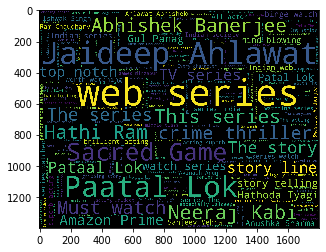

In [48]:
word_cloud_imdb = WordCloud(
                        background_color = "black",
                        width=1800,
                        height = 1400,
                        ).generate(cleaned_reviews)
plt.imshow(word_cloud_imdb)

#### 'web series', 'paatal lok', 'Jaideep Ahlawat' are most frequently used unique words in the reviews

In [49]:
# List of all the unique words in the reviews

In [50]:
imdb_unique_words = list(set("".join(cleaned_reviews).split(" ")))
imdb_unique_words

['wave',
 'alas',
 'wingers',
 'carries',
 'books',
 'SERIES',
 'decreasing',
 'YOU',
 'meaning',
 'tenacious',
 'actions',
 'designer',
 'conspiracies',
 'anushka',
 'suppress',
 'hinterland',
 'Keep',
 'norm',
 'created',
 'n6',
 'Violence',
 'Badlands',
 'Haryanavi',
 'reactions',
 'C',
 'ozzing',
 'adaptation',
 'claimed',
 'hide',
 'Durga',
 'terrifying',
 'Haathiraam',
 'fooled',
 'low',
 'wrote',
 'Slate',
 'policy',
 'consumer',
 'violance',
 'mistake',
 'loopholes',
 'First',
 'DO',
 'ringed',
 'Story',
 'gasp',
 'cost',
 'His',
 'Pretentious',
 'money',
 'mistakes',
 'anyways',
 'attempt',
 'reviews',
 'Call',
 'excited',
 'objects',
 'ground',
 'hathaudya',
 'list',
 'delight',
 'generating',
 'epitomizes',
 'experiments',
 'hits',
 'Gopal',
 'bore',
 'reflects',
 'mental',
 'Watch',
 'Hulu',
 'rustic',
 'Hitting',
 'speed',
 'holy',
 'celebreties',
 'Audiences',
 'deem',
 'traitors',
 'Secred',
 'tells',
 'Finished',
 'storyteller',
 'believable',
 'creature',
 'Due',
 'Les

In [51]:
len(imdb_unique_words)

7202

In [52]:
# Importing the positive words

In [53]:
with open(r"D:\Data science\Python codes\Data sets\NLP words list\positive-words.txt","r") as pos:
    poswords= pos.read().split("\n")

In [56]:
# List of postive words

In [55]:
poswords=poswords[36:]
poswords

['abound',
 'abounds',
 'abundance',
 'abundant',
 'accessable',
 'accessible',
 'acclaim',
 'acclaimed',
 'acclamation',
 'accolade',
 'accolades',
 'accommodative',
 'accomodative',
 'accomplish',
 'accomplished',
 'accomplishment',
 'accomplishments',
 'accurate',
 'accurately',
 'achievable',
 'achievement',
 'achievements',
 'achievible',
 'acumen',
 'adaptable',
 'adaptive',
 'adequate',
 'adjustable',
 'admirable',
 'admirably',
 'admiration',
 'admire',
 'admirer',
 'admiring',
 'admiringly',
 'adorable',
 'adore',
 'adored',
 'adorer',
 'adoring',
 'adoringly',
 'adroit',
 'adroitly',
 'adulate',
 'adulation',
 'adulatory',
 'advanced',
 'advantage',
 'advantageous',
 'advantageously',
 'advantages',
 'adventuresome',
 'adventurous',
 'advocate',
 'advocated',
 'advocates',
 'affability',
 'affable',
 'affably',
 'affectation',
 'affection',
 'affectionate',
 'affinity',
 'affirm',
 'affirmation',
 'affirmative',
 'affluence',
 'affluent',
 'afford',
 'affordable',
 'affordabl

In [57]:
len(poswords)

2006

In [58]:
# Importing negative words

In [59]:
with open(r"D:\Data science\Python codes\Data sets\NLP words list\negative-words.txt","r") as neg:
    negwords = neg.read().split("\n")

In [60]:
# List of negative words

In [61]:
negwords=negwords[37:]
negwords

['abnormal',
 'abolish',
 'abominable',
 'abominably',
 'abominate',
 'abomination',
 'abort',
 'aborted',
 'aborts',
 'abrade',
 'abrasive',
 'abrupt',
 'abruptly',
 'abscond',
 'absence',
 'absent-minded',
 'absentee',
 'absurd',
 'absurdity',
 'absurdly',
 'absurdness',
 'abuse',
 'abused',
 'abuses',
 'abusive',
 'abysmal',
 'abysmally',
 'abyss',
 'accidental',
 'accost',
 'accursed',
 'accusation',
 'accusations',
 'accuse',
 'accuses',
 'accusing',
 'accusingly',
 'acerbate',
 'acerbic',
 'acerbically',
 'ache',
 'ached',
 'aches',
 'achey',
 'aching',
 'acrid',
 'acridly',
 'acridness',
 'acrimonious',
 'acrimoniously',
 'acrimony',
 'adamant',
 'adamantly',
 'addict',
 'addicted',
 'addicting',
 'addicts',
 'admonish',
 'admonisher',
 'admonishingly',
 'admonishment',
 'admonition',
 'adulterate',
 'adulterated',
 'adulteration',
 'adulterier',
 'adversarial',
 'adversary',
 'adverse',
 'adversity',
 'afflict',
 'affliction',
 'afflictive',
 'affront',
 'afraid',
 'aggravate',

In [62]:
len(negwords)

4782

In [63]:
# Joining all the negative words into a paragraph

In [64]:
imdb_neg = " ".join([w for w in imdb_rev_words if w in negwords])
imdb_neg

'break wrong bad ignorant stranger flawed rotten steal stupid subordinate hate killing killing frustrating frustration anger remorseful angry disgusted pity deviate negative dead kills tired anxiety disorder unimportant blow hate hypocrite brutal inequalities kills cracks complex dark unexpected negative biased fascist crime hype murder desperate vulnerable limits slow burn defiantly negative regret crime unnecessary lengthy criminal crime worry slow issue sarcasm dark dragging plot bored oppression repression mediocrity ruin fake dangerous bitter bad crazy conspiracy fake issue twist backward conspiracy crime brutal crime haunting ugly depraved stupid killer lame conspiracies confused cliche criminal plot plot break wrong bad ignorant stranger flawed rotten steal stupid subordinate hate killing killing frustrating frustration anger remorseful angry disgusted pity deviate negative dead kills tired anxiety disorder unimportant blow hate hypocrite brutal inequalities kills cracks complex

In [65]:
len(imdb_neg)

450456

In [66]:
# Builiding wordcloud of negative words

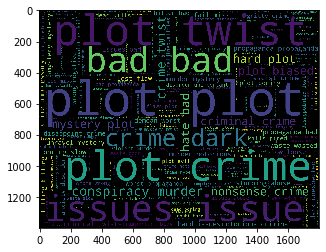

In [67]:
wordcloud_neg = WordCloud(
                        background_color = "black",
                        width=1800,
                        height=1400,
                        ).generate(imdb_neg)
plt.imshow(wordcloud_neg)

#### 'plot', 'bad', 'crime' is the most frequently used negative word

In [68]:
# Joining all the positive words into a paragraph

In [69]:
imdb_pos = " ".join([w for w in imdb_rev_words if w in poswords])
imdb_pos

'proves sensitive incredibly amazing brilliant tops realistic advanced won love wonder realistic amazing excellent excellent amazing tenacious perfect gem loved superb amazing worth praising brilliant capable praise amazing amazing amazingly proving lead superb flawless liked won improvement capable calm respect hero love helping loved brilliant beautiful genius amazingly realistic lead lead recommended genuine lover fantastic talent realistic perfect top satisfy happy worth brilliant noteworthy creative worth respectable steady solid worth amazing wow happy strong keen engaging awesome engaging engaging lead flawless enjoyed gem awesome outstanding fast fantastic congratulate amazing magic proud magical wise brilliant fresh perfect brilliance gem appropriate clean worthy strongest winner delighted likes outstandingly gains merry merry amazing loves loves loved enjoying innovative strong sublime masterpiece worth superb brilliant wow pretty remarkable perfectly strong brilliant worth g

In [70]:
len(imdb_pos)

564559

In [71]:
# Builiding wordcloud of positive words

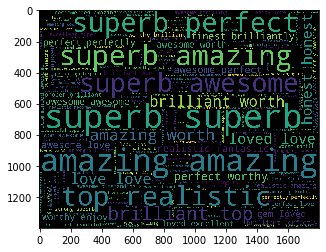

In [72]:
wordcloud_pos = WordCloud(
                        background_color ="black",
                        width=1800,
                        height=1400,
                        ).generate(imdb_pos)
plt.imshow(wordcloud_pos)

#### 'superb', 'amazing', 'top' are most frequent positive words in the reviews

#### Observations
The number of positive words are higher compared to number of negative words in the reviews.

Most frequently used positive words like 'superb', 'amazing' and 'realisitic' indicates many people have liked the web series.

Most frequently used negative words like 'crime', 'dark' and 'issues' indicates the show is more crime and thriller based genre which some poeple may not like.
 
Overall, with the positive words like 'superb', 'amazing' and 'realistic' its clear that most of the people have liked the web series.